In [1]:
import torch
import torch.distributions as D
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import sys
import matplotlib.pyplot as plt

from tqdm.auto import trange
from copy import deepcopy
from itertools import cycle
from sklearn.model_selection import train_test_split

from torchinterp1d import Interp1d


sys.path.append("../lib")

from nf.NF_base import *
from nf.realnvp import *
from swgf_mynf import SWGF as swgf_nf
from swgf_mlp import SWGF as swgf_mlp
from sw import *
from nf.utils_nf import log_likelihood

from fid_score import *

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

## Data

In [3]:
transform = torchvision.transforms.Compose([
                torchvision.transforms.CenterCrop(178),
                torchvision.transforms.Resize((64,64)),
                torchvision.transforms.ToTensor(),
    ])

dataset = torchvision.datasets.ImageFolder(root="~/celeba", transform=transform)

print(len(dataset))

182637


In [7]:
train_idx, test_idx = train_test_split(list(range(len(dataset))), test_size=0.2)
train_dataset = torch.utils.data.Subset(dataset, train_idx)
test_dataset = torch.utils.data.Subset(dataset, test_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

torch.Size([32, 3, 64, 64]) 9984


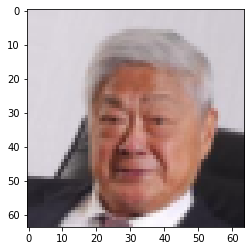

In [8]:
real_cpu = torch.zeros((10000,3,64,64))

cpt = 0
for data, _ in test_loader:
    if cpt+32>10000:
#         real_cpu[cpt:] = inverse_logit(data)
        print(data.size(), cpt)
        real_cpu[cpt:] = data[:10000-cpt]
        break
    else:
#         real_cpu[cpt:cpt+32] = inverse_logit(data)
        real_cpu[cpt:cpt+32] = data
    cpt += 32
    
plt.imshow(np.transpose(real_cpu[-1],(1,2,0)))
plt.show()

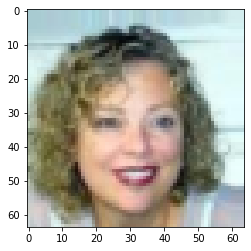

In [9]:
train_cpu = torch.zeros((10000,3,64,64))

cpt = 0
for data, _ in train_loader:
    if cpt+128>10000:
        train_cpu[cpt:] = data[:16]
    else:
        train_cpu[cpt:cpt+128] = data
    cpt += 128
    if cpt>10000:
        break
    
plt.imshow(np.transpose(train_cpu[-1],(1,2,0)))
plt.show()

In [10]:
def create_RealNVP(nh, nl, d):
    shiftings = [shifting(d//2,nh,d//2,2) for k in range(nl)]
    scalings = [scaling(d//2,nh,d//2,2) for k in range(nl)]

    flows = []
    for i in range(nl):
        flows.append(AffineCoupling(scalings[i],shiftings[i],d))
        flows.append(Reverse(d))
        flows.append(BatchNorm(d))

    model = NormalizingFlows(flows).to(device)
    return model

## With Pretrained AutoEncoder from SWF

Code from: https://github.com/aliutkus/swf/blob/master/code/networks/autoencoder.py

In [11]:
def val_ae(rho, autoencoder, device, d=48):
    with torch.no_grad():
        model.eval()
        rho.eval()

        torch.manual_seed(42)
        r,c = 5,5
        z_random = torch.randn(r,c,d,device=device)

        zs, _ = rho(z_random.reshape(-1,d))
        gen_imgs = model.decode(zs[-1]).detach().cpu().reshape(-1,3,64,64)

        cpt = 0
        fig,ax = plt.subplots(r,c)
        for i in range(r):
            for j in range(c):
                ax[i,j].imshow(np.transpose(gen_imgs[cpt],(1,2,0)))
                ax[i,j].axis("off")
                cpt += 1
                
        fig.set_size_inches(6, 6)
        plt.tight_layout()
        plt.show()

In [12]:
class ConvEncoder(nn.Module):
    def __init__(self, input_shape, bottleneck_size=64):
        super(ConvEncoder, self).__init__()
        self.input_shape = input_shape
        self.conv1 = nn.Conv2d(self.input_shape[0], 3,
                               kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(3, input_shape[-1], kernel_size=2,
                               stride=2, padding=0)
        self.conv3 = nn.Conv2d(input_shape[-1], input_shape[-1],
                               kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(input_shape[-1], input_shape[-1],
                               kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(int(input_shape[-1]**3/4), bottleneck_size)

    def forward(self, x):
        if len(x.shape) == 3:
            x = x[None, ...]

        out = torch.relu(self.conv1(x))
        out = torch.relu(self.conv2(out))
        out = torch.relu(self.conv3(out))
        out = torch.relu(self.conv4(out))
        out = out.view(out.size(0), -1)
        return torch.relu(self.fc1(out))


class ConvDecoder(nn.Module):
    def __init__(self, input_shape, bottleneck_size=64):
        super(ConvDecoder, self).__init__()
        self.input_shape = input_shape
        d = input_shape[-1]

        self.fc4 = nn.Linear(bottleneck_size, int(d/2 * d/2 * d))
        self.deconv1 = nn.ConvTranspose2d(d, d,
                                          kernel_size=3, stride=1, padding=1)
        self.deconv2 = nn.ConvTranspose2d(d, d,
                                          kernel_size=3, stride=1, padding=1)
        self.deconv3 = nn.ConvTranspose2d(d, d,
                                          kernel_size=2, stride=2, padding=0)
        self.conv5 = nn.Conv2d(d, self.input_shape[0],
                               kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        d = self.input_shape[-1]
        out = torch.relu(self.fc4(x))
        out = out.view(-1, d, int(d/2), int(d/2))
        out = torch.relu(self.deconv1(out))
        out = torch.relu(self.deconv2(out))
        out = torch.relu(self.deconv3(out))
        return torch.sigmoid(self.conv5(out))


class DenseEncoder(nn.Module):
    def __init__(self, input_shape, bottleneck_size=64):
        super(DenseEncoder, self).__init__()
        self.input_shape = input_shape
        intermediate_size = max(64, bottleneck_size)
        self.fc1 = nn.Linear(np.prod(input_shape), intermediate_size)
        self.fc2 = nn.Linear(intermediate_size, bottleneck_size)

    def forward(self, x):
        out = self.fc1(x.view(-1, np.prod(self.input_shape)))
        out = torch.relu(out)
        out = self.fc2(out)
        return torch.relu(out)


class DenseDecoder(nn.Module):
    def __init__(self, input_shape, bottleneck_size=64):
        super(DenseDecoder, self).__init__()
        self.input_shape = input_shape
        intermediate_size = max(64, bottleneck_size)
        self.fc1 = nn.Linear(bottleneck_size, intermediate_size)
        self.fc2 = nn.Linear(intermediate_size, np.prod(input_shape))

    def forward(self, x):
        out = torch.relu(self.fc1(x))
        return torch.sigmoid(self.fc2(out)).view(
            -1, self.input_shape[0], self.input_shape[1], self.input_shape[2]
        )


class AutoEncoder(nn.Module):
    def __init__(self, input_shape=(1, 28, 28), bottleneck_size=64,
                 convolutive=False):
        super(AutoEncoder, self).__init__()
        self.input_shape = input_shape
        self.encode = (ConvEncoder(input_shape, bottleneck_size)
                       if convolutive
                       else DenseEncoder(input_shape, bottleneck_size))
        self.decode = (ConvDecoder(input_shape, bottleneck_size)
                if convolutive
                       else DenseDecoder(input_shape, bottleneck_size))

    def encode_nograd(self, x):
        with torch.no_grad():
            return self.encode(x)

    def decode_nograd(self, x):
        with torch.no_grad():
            return self.decode(x)

    def forward(self, x):
        return self.decode(self.encode(x))


class AE(object):
    def __init__(self, input_shape, device, bottleneck_size=64,
                 convolutive=False):
        super(AE, self).__init__()
        self.bottleneck_size = bottleneck_size
        self.device = device
        self.criterion = nn.BCELoss()
        self.input_shape = input_shape
        self.model = AutoEncoder(
            input_shape=self.input_shape,
            bottleneck_size=self.bottleneck_size,
            convolutive=convolutive
        ).to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-3)

    def train(self, data_loader, num_epochs=10):
        for epoch in range(1, num_epochs + 1):
            self.model.train()
            train_loss = 0
            for batch_idx, (X, _) in enumerate(data_loader):
                X = X.to(self.device)
                self.optimizer.zero_grad()
                Y = self.model(X)
                loss = self.criterion(Y, X)
                loss.backward()
                train_loss += loss.item()
                self.optimizer.step()

            print('AE train => Epoch: {} Average loss: {:.4f}'.format(
                epoch, train_loss / len(data_loader.dataset)))

    def test(self, data_loader):
        self.model.eval()
        test_loss = 0
        with torch.no_grad():
            for i, (X, _) in enumerate(data_loader):
                X = X.to(device)
                Y = self.model(X)
                test_loss += self.criterion(Y, X).item()
                if i == 0:
                    n = min(X.size(0), 8)
                    comparison = torch.cat([
                        X[:n],
                        Y.view(data_loader.batch_size, 1, 32, 32)[:n]
                    ])
                    save_image(
                        comparison.cpu(),
                        'results/reconstruction.png',
                        nrow=n
                    )

        test_loss /= len(test_loader.dataset)
        print('AE test => Test set loss: {:.4f}'.format(test_loss))

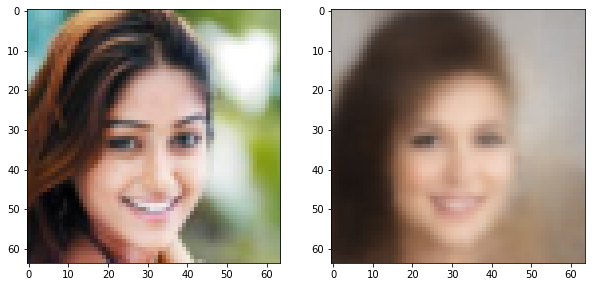

In [13]:
autoencoder = AE(train_loader.dataset[0][0].shape, device, 48, convolutive=True)
state = torch.load("./ae48conv64CelebA.model")
autoencoder.model.load_state_dict(state)
model = autoencoder.model.to(device)
# model.eval()

for x_val, _ in test_loader:
    fig,ax = plt.subplots(1,2,figsize=(10,10))

    ax[0].imshow(np.transpose(x_val[0], (1,2,0)))

    x_val = x_val.to(device)

    model.eval()
    yhat = model(x_val)
    ax[1].imshow(np.transpose(yhat[0].cpu().detach().numpy(), (1,2,0)))
    plt.show()
    break

In [14]:
real_cpu = torch.transpose(real_cpu, 1, 2)
real_cpu = torch.transpose(real_cpu, 2, 3)

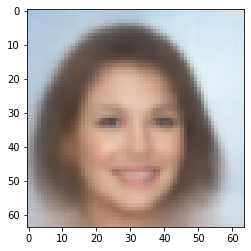

In [15]:
gen_imgs = torch.zeros((10000,3,64,64))

for k in range(10):
    imgs = model(train_cpu[k*1000:(k+1)*1000].to(device)).detach().cpu()
    gen_imgs[k*1000: (k+1)*1000] = imgs

plt.imshow(np.transpose(gen_imgs[-1],(1,2,0)))
plt.show()

In [16]:
gen_imgs = torch.transpose(gen_imgs, 1, 2)
gen_imgs = torch.transpose(gen_imgs, 2, 3)

evaluate_fid_score(real_cpu.detach().cpu().numpy(), gen_imgs.detach().cpu().numpy(), batch_size=25)

77.6883567229882

### Gradient Flows + RealNVP

In [18]:
rand_sampler = torch.utils.data.RandomSampler(train_dataset) #, replacement=True)
train_sampler = torch.utils.data.DataLoader(train_dataset, batch_size=128, sampler=rand_sampler)
dataiter = iter(cycle(train_sampler))

In [18]:
def J(x, z, log_det):
    target = next(dataiter)[0].to(device)
    target_encoded = model.encode(target)
    
    sw = sliced_wasserstein(x, target_encoded, num_projections=1000, device=device, 
                           u_weights=None, v_weights=None, p=2) 
    return sw/2

In [19]:
t_init = 0
t_end = 2
h = 0.1

n_steps = int(np.ceil((t_end-t_init)/h))

d = 48

mu0 = torch.zeros(d, device=device, dtype=torch.float)
sigma0 = torch.eye(d, device=device, dtype=torch.float)
rho_0 = D.MultivariateNormal(mu0,sigma0)

lrs = 5e-3 * np.ones(n_steps)
lrs[0] = 1e-2

n_epochs = 1000 * np.ones(n_steps)
n_epochs[0] = 3000
n_epochs[1] = 2000

Lrho = swgf_nf(rho_0, h, n_step=n_steps, n_epochs=n_epochs, d=d,
               J=J, create_NF=create_RealNVP, nh=1024, nl=1, lrs=lrs, 
               num_projections=1000, n_samples=1024, plot_loss=False, tqdm_bar=True)

  0%|          | 0/20 [00:00<?, ?it/s]

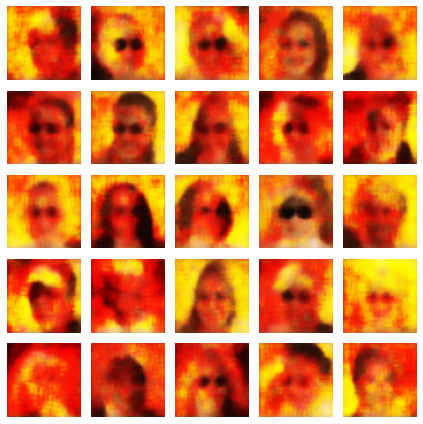

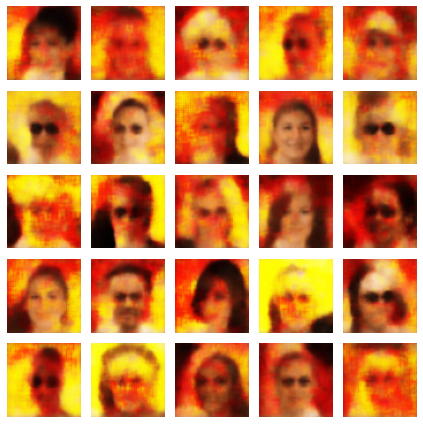

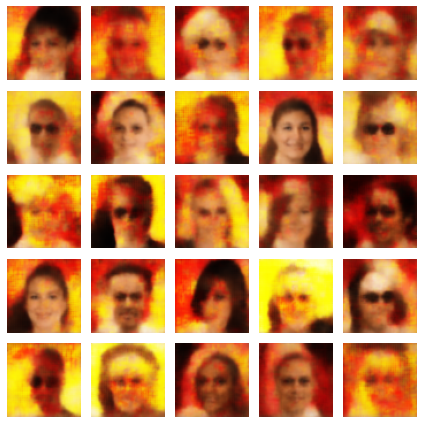

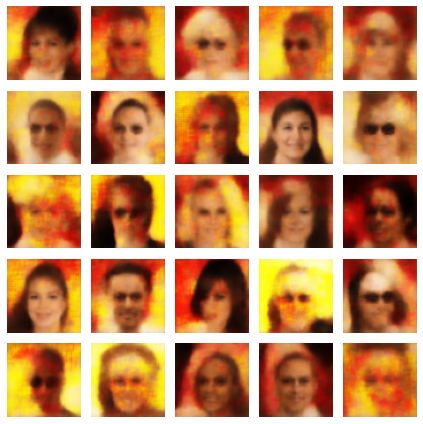

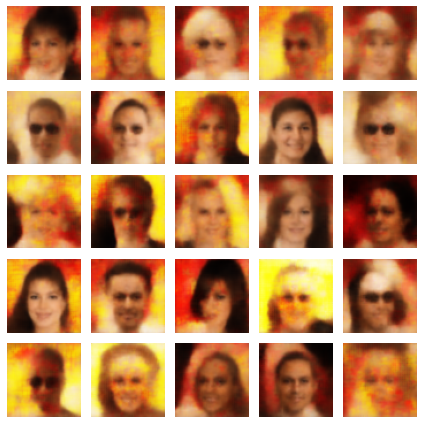

...

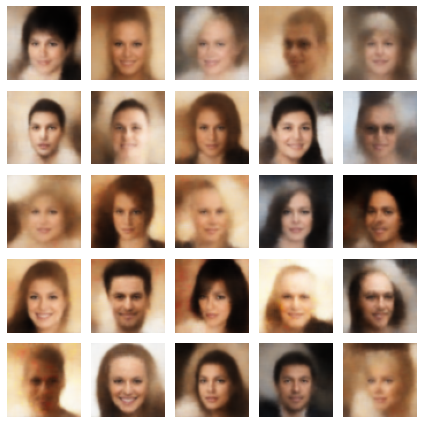

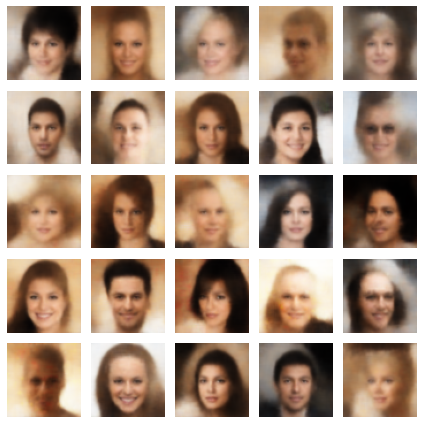

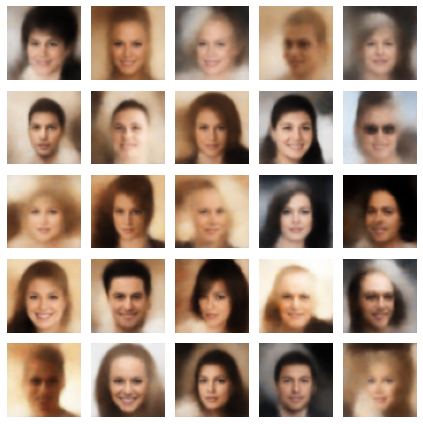

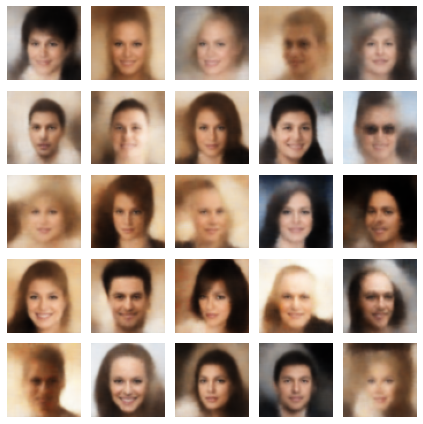

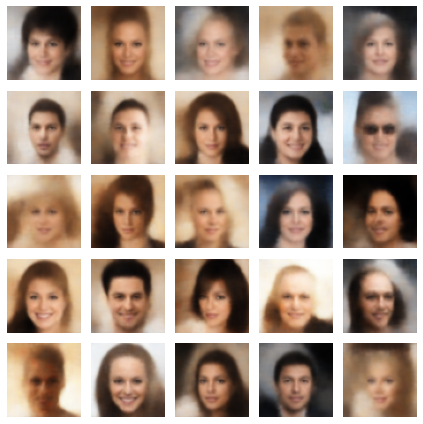

In [39]:
for k in range(len(Lrho)):
    if k>0:
        val_ae(Lrho[k], model, device)
    else:    
        r,c = 5,5

        zs = Lrho[0].sample((r,c,d))
        gen_imgs = model.decode(zs).detach().cpu().reshape(-1,3,64,64)

        cpt = 0
        fig,ax = plt.subplots(r,c)
        for i in range(r):
            for j in range(c):
                ax[i,j].imshow(np.transpose(gen_imgs[cpt],(1,2,0)))
                ax[i,j].axis("off")
                cpt += 1

        fig.set_size_inches(6, 6)
        plt.tight_layout()
        plt.show()

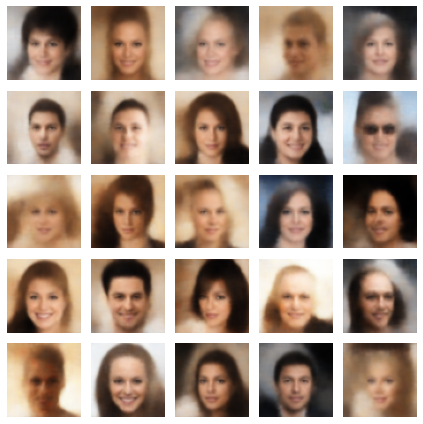

In [46]:
val_ae(Lrho[-1], model, device)

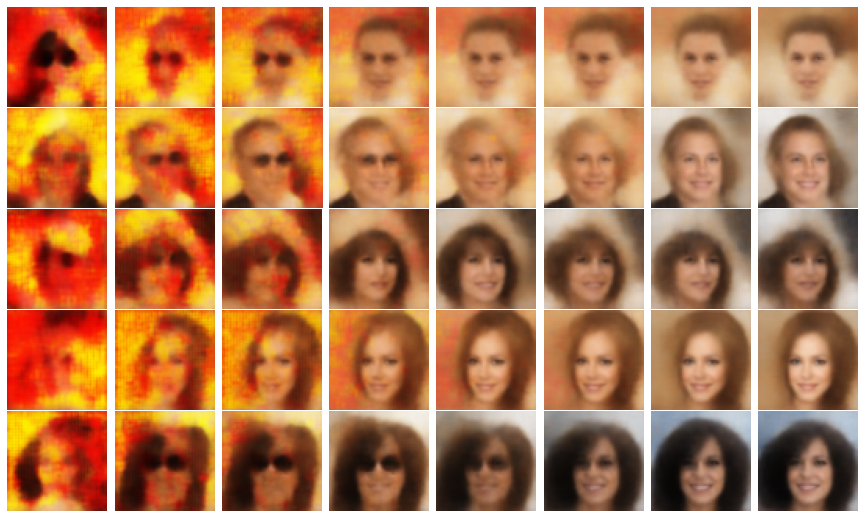

In [41]:
inds = [0,1,3,7,10,13,18,20]
r = 5

z_random = torch.randn(r,48,device=device)

fig, ax = plt.subplots(r,len(inds),figsize=(12,7))
for i, ind in enumerate(inds):
    for j in range(r):
        if ind>0:
#             print(j, z_random.size(), ind, len(Lrho))
            zs, _ = Lrho[ind](z_random[j].reshape(1,-1))
            gen_imgs = model.decode(zs[-1]).detach().cpu().reshape(-1,3,64,64)
        else:
            gen_imgs = model.decode(z_random[j]).detach().cpu().reshape(-1,3,64,64)
        ax[j,i].imshow(np.transpose(gen_imgs[0],(1,2,0)))
        ax[j,i].axis("off")

# fig.set_size_inches(6, 6)
plt.tight_layout(pad=0, h_pad=0.1, w_pad=0.005)
plt.show()

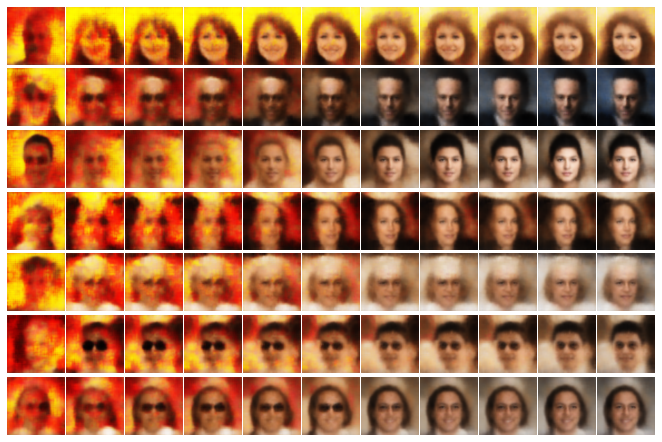

In [48]:
r = 7

inds = [0,1,2,3,5,7,11,13,15,18,20]

z_random = torch.randn(r,48,device=device)

fig, ax = plt.subplots(r,len(inds),figsize=(9,6))
for i, ind in enumerate(inds):
    for j in range(r):
        if ind>0:
#             print(j, z_random.size(), ind, len(Lrho))
            zs, _ = Lrho[ind](z_random[j].reshape(1,-1))
            gen_imgs = model.decode(zs[-1]).detach().cpu().reshape(-1,3,64,64)
        else:
            gen_imgs = model.decode(z_random[j]).detach().cpu().reshape(-1,3,64,64)
        ax[j,i].imshow(np.transpose(gen_imgs[0],(1,2,0)))
        ax[j,i].axis("off")

# fig.set_size_inches(6, 6)
plt.tight_layout(pad=0, h_pad=0.1, w_pad=0.1)
plt.show()

In [45]:
gen_imgs = torch.zeros((10000,3,64,64))

for k in range(10):
    z = torch.randn(1000, d, device=device)
    x, _ = Lrho[-1](z)
    imgs = model.decode(x[-1]).detach().cpu()
    
    gen_imgs[k*1000:(k+1)*1000] = imgs

gen_imgs = torch.transpose(gen_imgs, 1, 2)
gen_imgs = torch.transpose(gen_imgs, 2, 3)
    
evaluate_fid_score(real_cpu.detach().cpu().numpy(), gen_imgs.detach().cpu().numpy(), batch_size=25)

90.86641968683227

### Gradient Flows + MLP

In [30]:
def val_ae(rho, autoencoder, device, d=48):
    with torch.no_grad():
        model.eval()
        rho.eval()

        torch.manual_seed(42)
        r,c = 5,5
        z_random = torch.randn(r,c,d,device=device)
        
        if rho.__class__.__name__ == "NormalizingFlows":
            zs, _ = rho(z_random.reshape(-1,d))
            gen_imgs = autoencoder.decode(zs[-1]).detach().cpu().reshape(-1,3,64,64)
        else:
            zs = rho(z_random.reshape(-1,d))
            gen_imgs = autoencoder.decode(zs).detach().cpu().reshape(-1,3,64,64)

        cpt = 0
        fig,ax = plt.subplots(r,c)
        for i in range(r):
            for j in range(c):
                ax[i,j].imshow(np.transpose(gen_imgs[cpt],(1,2,0)))
                ax[i,j].axis("off")
                cpt += 1
                
        fig.set_size_inches(6, 6)
        plt.tight_layout()
        plt.show()

In [25]:
class mlp(nn.Module):
    def __init__(self, d_in, nh, d_out, n_layers):
        super().__init__()
        self.layers = nn.ModuleList()
        self.layers.append(nn.Linear(d_in,nh))
        for i in range(n_layers):
            self.layers.append(nn.Linear(nh,nh))
        self.layers.append(nn.Linear(nh,d_out))

    def forward(self, x):
        for layer in self.layers:
            x = F.leaky_relu(layer(x),0.2)
        return x

In [26]:
def J(rho):    
    target = next(dataiter)[0].to(device)
    target_encoded = model.encode(target)
    
    z = torch.randn(target.size(0), target_encoded.size(1), device=device)
    x = rho(z)
    
    sw = sliced_wasserstein(x, target_encoded, num_projections=1000, device=device, 
                           u_weights=None, v_weights=None, p=2) 
    return sw/2

In [27]:
t_init = 0
t_end = 2
h = 0.1

n_steps = int(np.ceil((t_end-t_init)/h))

d = 48

mu0 = torch.zeros(d, device=device, dtype=torch.float)
sigma0 = torch.eye(d, device=device, dtype=torch.float)
rho_0 = D.MultivariateNormal(mu0,sigma0)

lrs = 1e-3 * np.ones(n_steps)
lrs[0] = 5e-3

n_epochs = 1000 * np.ones(n_steps)
n_epochs[0] = 3000
n_epochs[1] = 2000

Lrho = swgf_mlp(rho_0, h, n_step=n_steps, n_epochs=n_epochs, d=d,
                J=J, create_nn=mlp, nh=512, nl=5, lrs=lrs, 
                num_projections=1000, n_samples=1000, plot_loss=False, tqdm_bar=True)

  0%|          | 0/20 [00:00<?, ?it/s]

In [28]:
gen_imgs = torch.zeros((10000,3,64,64))

for k in range(10):
    z = torch.randn(1000, d, device=device)
    x = Lrho[-1](z)
    imgs = model.decode(x).detach().cpu()
    
    gen_imgs[k*1000:(k+1)*1000] = imgs

gen_imgs = torch.transpose(gen_imgs, 1, 2)
gen_imgs = torch.transpose(gen_imgs, 2, 3)
    
evaluate_fid_score(real_cpu.detach().cpu().numpy(), gen_imgs.detach().cpu().numpy(), batch_size=25)

87.96054602981167

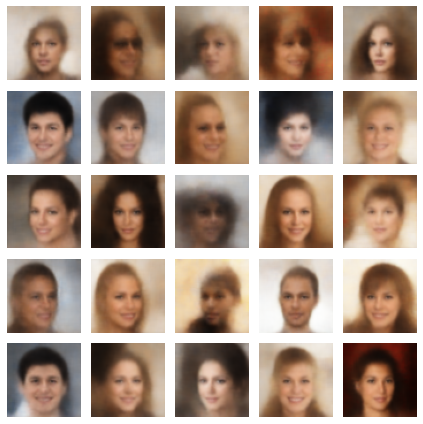

In [31]:
val_ae(Lrho[-1], model, device)

### SWF

In [18]:
rand_sampler = torch.utils.data.RandomSampler(train_dataset) #, replacement=True)
train_sampler = torch.utils.data.DataLoader(train_dataset, batch_size=128, sampler=rand_sampler)
dataiter = iter(cycle(train_sampler))

In [45]:
def swf(n, d, n_epochs, dataiter, autoencoder, device=device, 
        tauk=1e-1, n_projs=50, reg=1e-4, plot=False):
    
    x0 = torch.randn(n, d, device=device)
    L = [x0.cpu().clone()]
    
    xk = x0.clone()

    percentiles = torch.linspace(0,1,100,device=device)

    pbar = trange(n_epochs)
    for k in pbar:

        if plot and k%100==0:
            print("Iteration " + str(k))
            gen_imgs = torch.zeros((10000,3,64,64))

            for i in range(10):
                imgs = autoencoder.decode(xk[i*1000:(i+1)*1000].to(device)).detach().cpu().reshape(-1,3,64,64)
                gen_imgs[i*1000:(i+1)*1000] = imgs
                
            r, c = 5, 5
            cpt = 0
            fig,ax = plt.subplots(r,c)
            for i in range(r):
                for j in range(c):
                    ax[i,j].imshow(np.transpose(gen_imgs[cpt],(1,2,0)))
                    ax[i,j].axis("off")
                    cpt += 1

            fig.set_size_inches(6, 6)
            plt.tight_layout()
            plt.show()


        theta = torch.randn(n_projs, d)
        theta = F.normalize(theta, p=2, dim=1).to(device)

        target = autoencoder.encode(next(dataiter)[0].to(device)).detach()

        target_proj = (target@theta.T).T
        xk_proj = (xk@theta.T).T
        torch.sort(target_proj, -1)
        torch.sort(xk_proj, -1)

        xk_quantiles = torch.tensor(np.percentile(xk_proj.cpu(), percentiles.cpu()*100, axis=1), 
                                    device=device, dtype=torch.float32).T
        cdf_xk = Interp1d()(xk_quantiles, percentiles, xk_proj).detach()
        
        target_quantiles = torch.tensor(np.percentile(target_proj.cpu(), percentiles.cpu()*100, axis=1), 
                                        device=device, dtype=torch.float).T
        q = Interp1d()(percentiles.repeat(n_projs,1), target_quantiles, cdf_xk).detach()

        nabla = ((xk_proj-q)[:,None,:]*theta[:,:,None]).mean(dim=0).T

        zk = torch.randn(xk.size(), device=device)
        xk = xk - tauk * nabla + np.sqrt(2*tauk*reg) * zk
        L.append(xk.cpu().clone())
    
    return L

  0%|          | 0/1000 [00:00<?, ?it/s]

Iteration 0


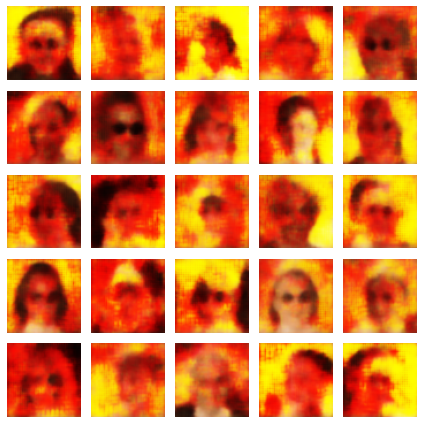

Iteration 100


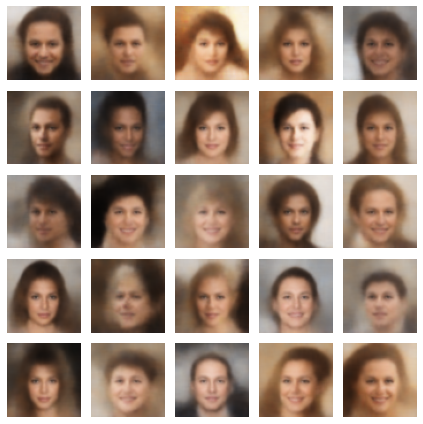

Iteration 200


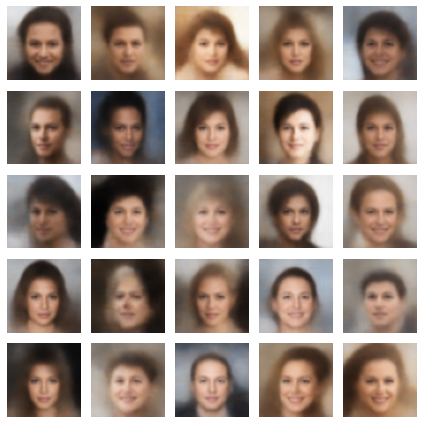

Iteration 300


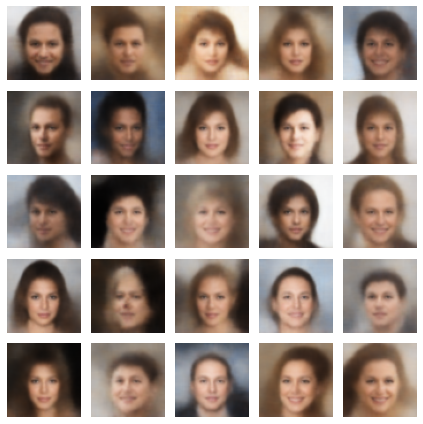

Iteration 400


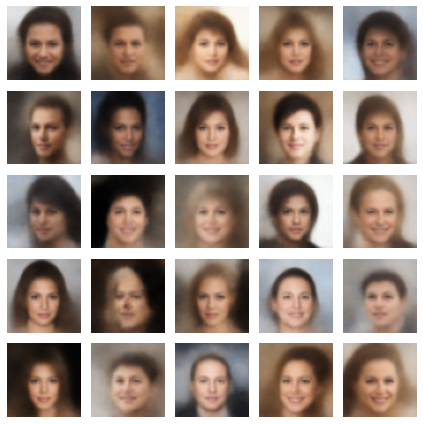

Iteration 500


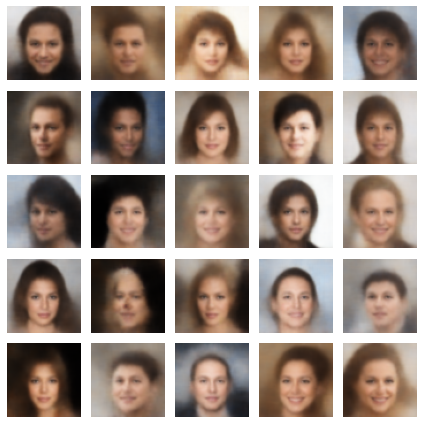

Iteration 600


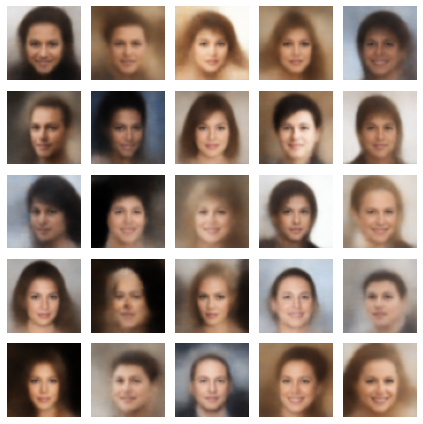

Iteration 700


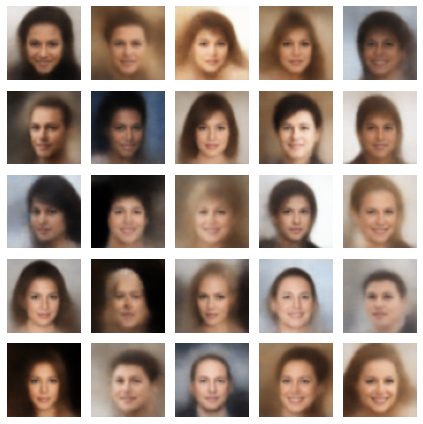

Iteration 800


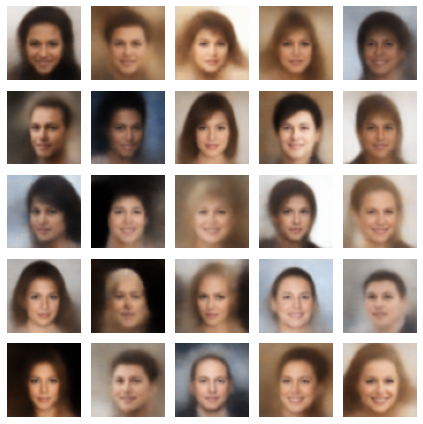

Iteration 900


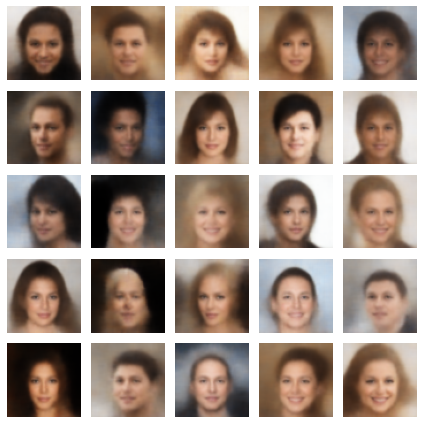

In [46]:
L = swf(10000, 48, 1000, dataiter, autoencoder=model, tauk=1, n_projs=1000, reg=1e-4, plot=True)

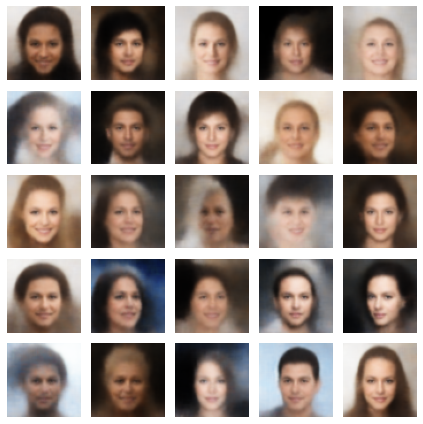

In [48]:
gen_imgs = torch.zeros((10000,3,64,64))

for k in range(10):
    imgs = model.decode(xk[k*1000:(k+1)*1000].to(device)).detach().cpu().reshape(-1,3,64,64)
    gen_imgs[k*1000:(k+1)*1000] = imgs

r, c = 5, 5
cpt = 0
fig,ax = plt.subplots(r,c)
for i in range(r):
    for j in range(c):
        ax[i,j].imshow(np.transpose(gen_imgs[cpt*100],(1,2,0)))
        ax[i,j].axis("off")
        cpt += 1

fig.set_size_inches(6, 6)
plt.tight_layout()
plt.show()

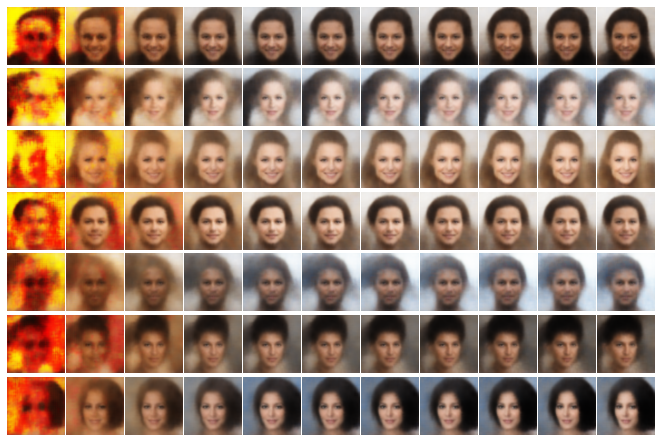

In [50]:
r = 7

# inds = [0,1,2,3,5,7,11,13,15,18,20]

inds = [0,25,50,100,250,375,500,625,750,875,1000]

imgs = [0,500,1000,1500,2000,5000,9000]

fig, ax = plt.subplots(r,len(inds),figsize=(9,6))
for i, ind in enumerate(inds):
    for j in range(r):
        gen_imgs = model.decode(L[ind][imgs[j]].to(device)).detach().cpu().reshape(-1,3,64,64)
        ax[j,i].imshow(np.transpose(gen_imgs[0],(1,2,0)))
        ax[j,i].axis("off")

# fig.set_size_inches(6, 6)
plt.tight_layout(pad=0, h_pad=0.1, w_pad=0.1)
plt.show()

In [47]:
xk = L[-1]
gen_imgs = torch.zeros((10000,3,64,64))

for k in range(10):
    imgs = model.decode(xk[k*1000:(k+1)*1000].to(device)).detach().cpu().reshape(-1,3,64,64)
    gen_imgs[k*1000:(k+1)*1000] = imgs

gen_imgs = torch.transpose(gen_imgs, 1, 2)
gen_imgs = torch.transpose(gen_imgs, 2, 3)

evaluate_fid_score(real_cpu.detach().cpu().numpy(), gen_imgs.detach().cpu().numpy(), batch_size=25)

91.23722035086953